# **Chicago 311 - Exploratory Data Analysis**


### **What 13.3M Service Requests can tell us about how a city really works?**


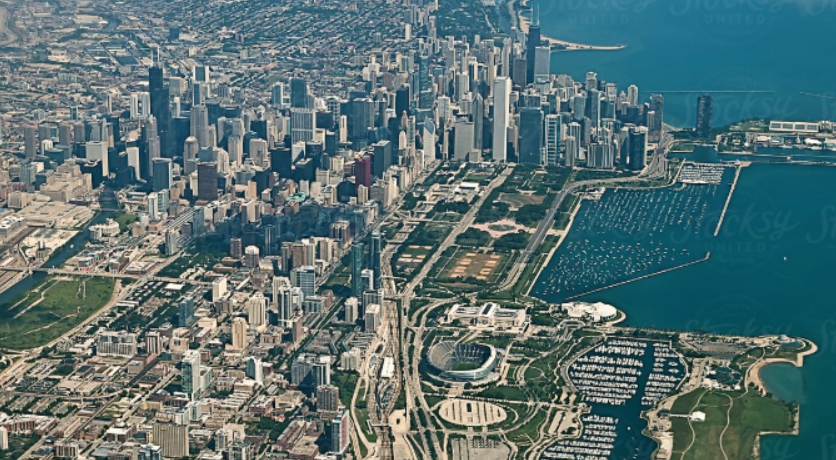

This notebook is an  **Exploratory Data Analysis** study of **over 6 years of [Chicago 311 Official Data](https://data.cityofchicago.org/Service-Requests/311-Service-Requests/v6vf-nfxy/about_data)** in order to uncover the main characteristics and behaviour of the city's service system through:



# **Domain Understanding**


### The **city's customer service desk**.

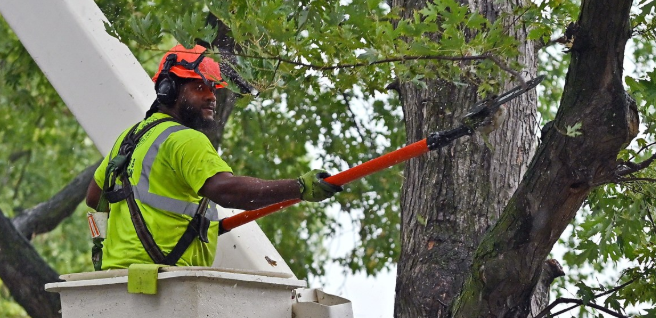


**[Chicago 311 - Service Requests](https://311.chicago.gov/s/?language=en_US)** is **Chicago’s official system** for **non-emergency service requests**.


**How it works:**
1. **Citizens submit requests through official channels** (Phone, web, app)
2. **Requests are routed to respective Departments** (Streets, Sanitation, Aviation)
3. **Departments handles requests** (Fix pothole, remove graffiti, trim tree.)
4. **Status updates tracked** (Open → In Progress → Completed)

**Why this data matters:**
- **~13.3M records over 6 years** 
- **Spatially tagged** 
- **Time-stamped** 
- **Daily updated** -> living dataset for real-world ML

This detailed database provides a **real-time window** into **urban inequality**, **infrastructure decay**, and **citizen behavior**. Enabling **exceptional inteligence source** for use in **strategic planning and operational action** for **public services.**



### **Service Requests Formulary**

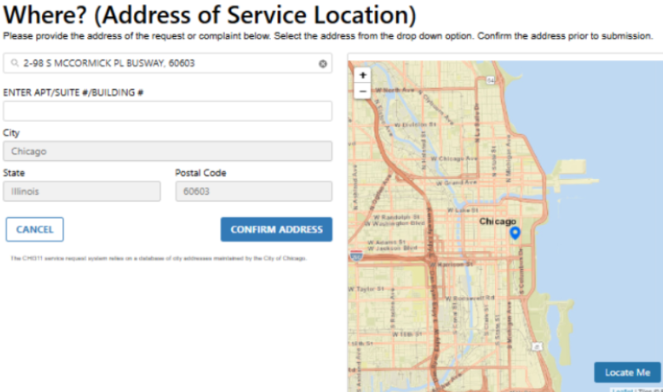



### **Service Requests examples**
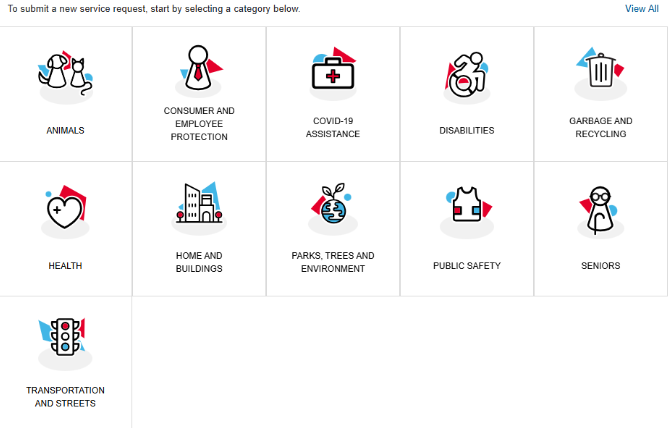




# **Data Understanding**



## **Data Preprocessing**



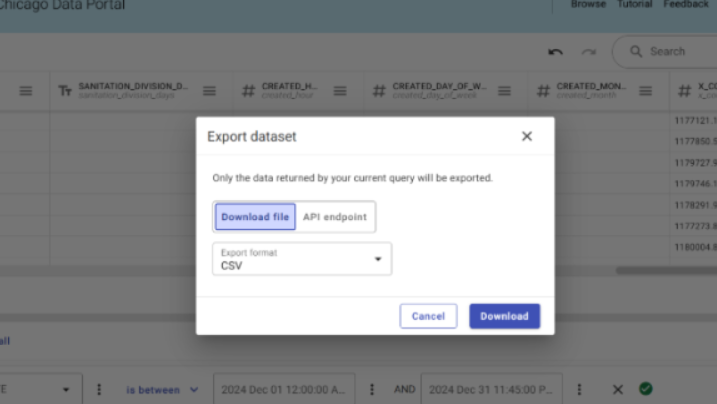


- Data is available via file **downloads** and an **API** and **yearly CSV downloads** were used to ensure full control and stability.

- Each year was downloaded separately and then stacked and converted into a **single Parquet file (~13.3M records)** (`data.parquet`), which is the source used in this notebook.

**DuckDB**

**SQL database** used alongside **pandas** to improve **speed and stability**.

Here, we use **sampling** to **inspect dominant behaviors**, then create **SQL views** to adjust dataset characteristics.

In [1]:
from pathlib import Path
import pandas as pd
import duckdb as db
import matplotlib.pyplot as plt
import seaborn as sns
import geoviews as gv
import datashader as datashade
from holoviews.operation.datashader import datashade
from colorcet import fire

In [2]:

con = db.connect()
DATA_DIR = Path('data/raw')
OUTPUT_FILE = Path('data/processed/stack.csv')

print(f'[CONFIG] DATA_DIR={DATA_DIR} | OUTPUT_FILE={OUTPUT_FILE}')

[CONFIG] DATA_DIR=data\raw | OUTPUT_FILE=data\processed\stack.csv


In [3]:
# Verifying files
def ensure_output_dir(path: Path) -> None:
    path.parent.mkdir(parents=True, exist_ok=True)

def list_csv_files(data_dir: Path) -> list[Path]:
    files = sorted(data_dir.glob('*.csv'))
    assert files, 'No CSV files found'
    return files

ensure_output_dir(OUTPUT_FILE)
files = list_csv_files(DATA_DIR)

for file in files:
    print(file)         

print(f'Total: {len(files)} CSV files found')

data\raw\20 and under 2004970 rows.csv
data\raw\21-19 1940164 rows.csv
data\raw\21-20 2018176 rows.csv
data\raw\22-21 1821488 rows.csv
data\raw\23-22 1772092 rows.csv
data\raw\24-23 1818726 rows.csv
data\raw\25-24 1884950 rows.csv
data\raw\26-25 1980801 rows.csv
Total: 8 CSV files found


In [4]:
# Files schema
def scan_file(con: db.DuckDBPyConnection, file: Path):
    df = con.execute(f"""
        SELECT *
        FROM read_csv_auto('{file}', sample_size=-1)
    """).df()
    return set(df.columns), len(df)

schemas = []
row_counts = {}

for i, file in enumerate(files, start=1):
    cols, n_rows = scan_file(con, file)
    schemas.append(cols)
    row_counts[file.name] = n_rows

    print(
        f'[SCAN {i}/{len(files)}]'
        f'{file.name} | rows={n_rows} | cols={len(cols)}'
    )

print(f'[SCAN] Completed. Files scanned: {len(schemas)}')

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

[SCAN 1/8]20 and under 2004970 rows.csv | rows=2004970 | cols=39


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

[SCAN 2/8]21-19 1940164 rows.csv | rows=1940164 | cols=39


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

[SCAN 3/8]21-20 2018176 rows.csv | rows=2018176 | cols=39


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

[SCAN 4/8]22-21 1821488 rows.csv | rows=1821488 | cols=39


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

[SCAN 5/8]23-22 1772092 rows.csv | rows=1772092 | cols=39


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

[SCAN 6/8]24-23 1818726 rows.csv | rows=1818726 | cols=39


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

[SCAN 7/8]25-24 1884950 rows.csv | rows=1884950 | cols=39


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

[SCAN 8/8]26-25 1980801 rows.csv | rows=1980801 | cols=39
[SCAN] Completed. Files scanned: 8


In [5]:
# Consolidate CSV files into a single stack.csv using common columns

def consolidate_csvs(files: list[Path], schemas: list[set], con, output: Path, row_counts: dict):

    # determine common columns
    common_fields = sorted(set.intersection(*schemas))
    assert common_fields, "No common columns across files"

    # build UNION ALL query
    union_query = " UNION ALL ".join(
        [
            f'SELECT {", ".join(common_fields)} '
            f'FROM read_csv_auto("{f}", SAMPLE_SIZE=-1)'
            for f in files
        ]
    )

    # export consolidated file
    con.execute(f"""
        COPY (
            {union_query}
        )
        TO '{output}'
        WITH (HEADER, DELIMITER ',');
    """)

    

    # sanity check
    total_rows = sum(row_counts.values())

    print(f"[EXPORT] file={output}")
    print(f"[EXPORT] rows={total_rows} | cols={len(common_fields)}")


consolidate_csvs(files, schemas, con, OUTPUT_FILE, row_counts)
# initial stack in csv -> read_csv_auto will be used later to automatically read types

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

[EXPORT] file=data\processed\stack.csv
[EXPORT] rows=15241367 | cols=39


In [6]:
# converting high pct missingness columns to VARCHAR (preventing possible coalescing from read_csv_auto)
varchar_cols = {
    'LEGACY_SR_NUMBER': 'VARCHAR',
    'SANITATION_DIVISION_DAYS': 'VARCHAR',
    'PARENT_SR_NUMBER': 'VARCHAR',
    'ELECTRICAL_DISTRICT': 'VARCHAR',
    'CREATED_DEPARTMENT': 'VARCHAR',
    'CITY': 'VARCHAR',
    'STATE': 'VARCHAR',
    'ELECTRICITY_GRID': 'VARCHAR',
    'ZIP_CODE': 'VARCHAR'
}

df = con.execute(f"""
    SELECT *
    FROM read_csv_auto(
        '{OUTPUT_FILE}',
        sample_size=-1,
        timestampformat='%Y-%m-%d %H:%M:%S',
        types={varchar_cols})
""").df()

# checking missingess pct
# (df.isna().mean().sort_values(ascending=False).head(25) * 100).round(decimals=2)

con.register("df_view", df)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [7]:
# saving
con.execute("""
    COPY df_view
    TO 'data/processed/data.parquet'
    (FORMAT PARQUET)
""")

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [8]:
# preview
df_sample = con.execute("""
    SELECT *
    FROM 'data/processed/data.parquet'
    USING SAMPLE 10%
""").df()

df_sample.head()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,CITY,CLOSED_DATE,COMMUNITY_AREA,CREATED_DATE,CREATED_DAY_OF_WEEK,CREATED_DEPARTMENT,CREATED_HOUR,CREATED_MONTH,DUPLICATE,ELECTRICAL_DISTRICT,...,STATUS,STREET_ADDRESS,STREET_DIRECTION,STREET_NAME,STREET_NUMBER,STREET_TYPE,WARD,X_COORDINATE,Y_COORDINATE,ZIP_CODE
0,CHICAGO,2020-05-15 11:10:29,71,2018-09-07 11:00:31,6,None,11,9,False,11,...,Completed,8024 S ADA ST,S,ADA,8024,ST,21,"1168656,89","1851428,029",60620
1,CHICAGO,2020-04-22 07:26:01,71,2018-09-07 11:01:56,6,None,11,9,False,11,...,Completed,1319 W 80TH ST,W,80TH,1319,ST,21,"1168833,572","1851707,579",60620
2,CHICAGO,2019-05-21 17:32:03,7,2018-09-07 11:03:32,6,None,11,9,False,5,...,Completed,1848 N HOWE ST,N,HOWE,1848,ST,43,"1171579,892505","1912484,788131",60614
3,CHICAGO,2019-04-01 12:03:56,3,2018-09-07 11:04:24,6,None,11,9,False,2,...,Completed,1758 W LELAND AVE,W,LELAND,1758,AVE,47,"1163757,123923","1931326,908879",60640
4,CHICAGO,2019-04-01 12:05:25,3,2018-09-07 11:05:40,6,None,11,9,False,2,...,Completed,1756 W LELAND AVE,W,LELAND,1756,AVE,47,"1163784,660502","1931328,165079",60640


**Overview**

- **39 columns** - covering: time, space, categories and status
- **Mix of types:** - timestamps, coordinates categorical labels
- **Some quality issues:** - missing values, possible duplicates and type inconsistencies

We'll fix the obvious problems first, then explore.



## **Data Preparation**

In [9]:
# Preview (1/4)
df_sample[df_sample.columns[0:10]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1574912 entries, 0 to 1574911
Data columns (total 10 columns):
 #   Column               Non-Null Count    Dtype         
---  ------               --------------    -----         
 0   CITY                 1028649 non-null  object        
 1   CLOSED_DATE          1551146 non-null  datetime64[us]
 2   COMMUNITY_AREA       1572143 non-null  Int64         
 3   CREATED_DATE         1574912 non-null  datetime64[us]
 4   CREATED_DAY_OF_WEEK  1574912 non-null  int64         
 5   CREATED_DEPARTMENT   912643 non-null   object        
 6   CREATED_HOUR         1574912 non-null  int64         
 7   CREATED_MONTH        1574912 non-null  int64         
 8   DUPLICATE            1574912 non-null  bool          
 9   ELECTRICAL_DISTRICT  217064 non-null   object        
dtypes: Int64(1), bool(1), datetime64[us](2), int64(3), object(3)
memory usage: 111.1+ MB


In [10]:
# Preview (1/4)
df_sample[df_sample.columns[0:10]].head()

#     COLUMN               TYPE                CORRECT TYPE ?
# 0   CITY                 object              ✅        
# 1   CLOSED_DATE          datetime64[us]      ✅
# 2   COMMUNITY_AREA       Int64               ✅
# 3   CREATED_DATE         datetime64[us]      ✅
# 4   CREATED_DAY_OF_WEEK  int64               ✅
# 5   CREATED_DEPARTMENT   object              ✅
# 6   CREATED_HOUR         int64               ✅
# 7   CREATED_MONTH        int64               ✅
# 8   DUPLICATE            bool                ✅
# 9   ELECTRICAL_DISTRICT  object              ✅

,CITY,CLOSED_DATE,COMMUNITY_AREA,CREATED_DATE,CREATED_DAY_OF_WEEK,CREATED_DEPARTMENT,CREATED_HOUR,CREATED_MONTH,DUPLICATE,ELECTRICAL_DISTRICT
0,CHICAGO,2020-05-15 11:10:29,71,2018-09-07 11:00:31,6,None,11,9,False,11
1,CHICAGO,2020-04-22 07:26:01,71,2018-09-07 11:01:56,6,None,11,9,False,11
2,CHICAGO,2019-05-21 17:32:03,7,2018-09-07 11:03:32,6,None,11,9,False,5
3,CHICAGO,2019-04-01 12:03:56,3,2018-09-07 11:04:24,6,None,11,9,False,2
4,CHICAGO,2019-04-01 12:05:25,3,2018-09-07 11:05:40,6,None,11,9,False,2


In [11]:
# Preview (2/4)
df_sample[df_sample.columns[10:20]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1574912 entries, 0 to 1574911
Data columns (total 10 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   ELECTRICITY_GRID    1294189 non-null  object        
 1   LAST_MODIFIED_DATE  1574912 non-null  datetime64[us]
 2   LATITUDE            1572809 non-null  object        
 3   LEGACY_RECORD       1574912 non-null  bool          
 4   LEGACY_SR_NUMBER    8192 non-null     object        
 5   LOCATION            1572809 non-null  object        
 6   LONGITUDE           1572809 non-null  object        
 7   ORIGIN              1574912 non-null  object        
 8   OWNER_DEPARTMENT    1574912 non-null  object        
 9   PARENT_SR_NUMBER    88791 non-null    object        
dtypes: bool(1), datetime64[us](1), object(8)
memory usage: 109.6+ MB


In [12]:
# Preview (2/4)
df_sample[df_sample.columns[10:20]].head()

#     COLUMN                 TYPE          CORRECT TYPE ?
# 0   ELECTRICITY_GRID       object        ✅
# 1   LAST_MODIFIED_DATE     datetime64[us]✅
# 2   LATITUDE               object        ❌ -> Int64
# 3   LEGACY_RECORD          bool          ✅
# 4   LEGACY_SR_NUMBER       object        ✅
# 5   LOCATION               object        ✅
# 6   LONGITUDE              object        ❌ -> Int64
# 7   ORIGIN                 object        ✅
# 8   OWNER_DEPARTMENT       object        ✅
# 9   PARENT_SR_NUMBER       object        ✅

,ELECTRICITY_GRID,LAST_MODIFIED_DATE,LATITUDE,LEGACY_RECORD,LEGACY_SR_NUMBER,LOCATION,LONGITUDE,ORIGIN,OWNER_DEPARTMENT,PARENT_SR_NUMBER
0,M041,2020-05-15 11:10:29,"41,74784",True,CSR18-02599767,"(41.74784, -87.657564)","-87,657564",Phone Call,CDOT - Department of Transportation,None
1,M041,2020-04-22 07:26:01,"41,74860323",True,CSR18-02599811,"(41.74860323, -87.65690747)","-87,65690747",Phone Call,CDOT - Department of Transportation,None
2,O018,2020-02-13 17:23:37,"41,91532960095",True,CSR18-02599849,"(41.91532960094658, -87.64506535107363)","-87,64506535107",Generated In House,Streets and Sanitation,None
3,L011,2020-02-13 17:23:37,"41,96720208113",True,CSR18-02599870,"(41.967202081131134, -87.6732722896271)","-87,67327228963",Phone Call,Streets and Sanitation,None
4,L011,2020-02-13 17:23:37,"41,96720494603",True,CSR18-02599895,"(41.96720494602623, -87.67317100556387)","-87,67317100556",Phone Call,Streets and Sanitation,None


In [13]:
# Fixing types (2/4)

# New view
con.execute("""
    CREATE OR REPLACE VIEW data AS
    SELECT * REPLACE(
        REPLACE(LATITUDE,  ',', '.') :: DOUBLE AS LATITUDE,
        REPLACE(LONGITUDE, ',', '.') :: DOUBLE AS LONGITUDE
    )
    FROM 'data/processed/data.parquet';
""")

# Updating df_sample
df_sample = con.execute("""
    SELECT * FROM data USING SAMPLE 10%
""").df()

df_sample[df_sample.columns[10:20]].info()

#     COLUMN                 TYPE          CORRECT TYPE ?
# 0   ELECTRICITY_GRID       object        ✅
# 1   LAST_MODIFIED_DATE     datetime64[us]✅
# 2   LATITUDE               object        ❌ -> Int64 ✅
# 3   LEGACY_RECORD          bool          ✅
# 4   LEGACY_SR_NUMBER       object        ✅
# 5   LOCATION               object        ✅
# 6   LONGITUDE              object        ❌ -> Int64 ✅
# 7   ORIGIN                 object        ✅
# 8   OWNER_DEPARTMENT       object        ✅
# 9   PARENT_SR_NUMBER       object        ✅

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1484800 entries, 0 to 1484799
Data columns (total 10 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   ELECTRICITY_GRID    1223267 non-null  object        
 1   LAST_MODIFIED_DATE  1484800 non-null  datetime64[us]
 2   LATITUDE            1483161 non-null  float64       
 3   LEGACY_RECORD       1484800 non-null  bool          
 4   LEGACY_SR_NUMBER    0 non-null        object        
 5   LOCATION            1483161 non-null  object        
 6   LONGITUDE           1483161 non-null  float64       
 7   ORIGIN              1484800 non-null  object        
 8   OWNER_DEPARTMENT    1484800 non-null  object        
 9   PARENT_SR_NUMBER    82847 non-null    object        
dtypes: bool(1), datetime64[us](1), float64(2), object(6)
memory usage: 103.4+ MB


In [14]:
# Preview (3/4)
df_sample[df_sample.columns[20:30]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1484800 entries, 0 to 1484799
Data columns (total 10 columns):
 #   Column                    Non-Null Count    Dtype 
---  ------                    --------------    ----- 
 0   POLICE_BEAT               1482607 non-null  object
 1   POLICE_DISTRICT           1482606 non-null  object
 2   POLICE_SECTOR             1482607 non-null  Int64 
 3   PRECINCT                  1482145 non-null  Int64 
 4   SANITATION_DIVISION_DAYS  13442 non-null    object
 5   SR_NUMBER                 1484800 non-null  object
 6   SR_SHORT_CODE             1484800 non-null  object
 7   SR_TYPE                   1484800 non-null  object
 8   STATE                     965078 non-null   object
 9   STATUS                    1484800 non-null  object
dtypes: Int64(2), object(8)
memory usage: 116.1+ MB


In [15]:
# Preview (3/4)
df_sample[df_sample.columns[20:30]].head()

#     Column                        Dtype  CORRECT TYPE ?
# 0   POLICE_BEAT                    object✅
# 1   POLICE_DISTRICT                object✅
# 2   POLICE_SECTOR                  Int64 ✅
# 3   PRECINCT                       Int64 ✅
# 4   SANITATION_DIVISION_DAYS       object✅
# 5   SR_NUMBER                      object✅
# 6   SR_SHORT_CODE                  object✅
# 7   SR_TYPE                        object✅
# 8   STATE                          object✅
# 9   STATUS                         object✅

,POLICE_BEAT,POLICE_DISTRICT,POLICE_SECTOR,PRECINCT,SANITATION_DIVISION_DAYS,SR_NUMBER,SR_SHORT_CODE,SR_TYPE,STATE,STATUS
0,0531,05,3,43,Wednesday,SR19-00037604,PBS,Sidewalk Inspection Request,None,Completed
1,0824,08,2,16,Friday,SR19-00037605,PBS,Sidewalk Inspection Request,None,Completed
2,1613,16,1,12,Tuesday,SR19-00037606,PHF,Pothole in Street Complaint,None,Completed
3,2223,22,2,52,Monday,SR19-00037607,PBS,Sidewalk Inspection Request,None,Completed
4,0834,08,3,17,Wednesday,SR19-00037610,PBS,Sidewalk Inspection Request,None,Completed


In [16]:
# Preview (4/4)
df_sample[df_sample.columns[30:40]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1484800 entries, 0 to 1484799
Data columns (total 9 columns):
 #   Column            Non-Null Count    Dtype 
---  ------            --------------    ----- 
 0   STREET_ADDRESS    1483372 non-null  object
 1   STREET_DIRECTION  1483144 non-null  object
 2   STREET_NAME       1483357 non-null  object
 3   STREET_NUMBER     1483201 non-null  object
 4   STREET_TYPE       1472940 non-null  object
 5   WARD              1482583 non-null  Int64 
 6   X_COORDINATE      1483201 non-null  object
 7   Y_COORDINATE      1483201 non-null  object
 8   ZIP_CODE          1389735 non-null  object
dtypes: Int64(1), object(8)
memory usage: 103.4+ MB


In [17]:
# Preview (4/4)
df_sample[df_sample.columns[30:40]]

# 0   STREET_ADDRESS       object✅
# 1   STREET_DIRECTION     object✅
# 2   STREET_NAME          object✅
# 3   STREET_NUMBER        object✅
# 4   STREET_TYPE          object✅
# 5   WARD                 Int64 ✅
# 6   X_COORDINATE         object❌
# 7   Y_COORDINATE         object❌
# 8   ZIP_CODE             object✅

,STREET_ADDRESS,STREET_DIRECTION,STREET_NAME,STREET_NUMBER,STREET_TYPE,WARD,X_COORDINATE,Y_COORDINATE,ZIP_CODE
0,11239 S VERNON AVE,S,VERNON,11239,AVE,9,"1181322,534771","1830365,155551",60628
1,5609 S CALIFORNIA AVE,S,CALIFORNIA,5609,AVE,15,"1158733,93172","1867291,991389",60629
2,7111 W Argyle ST,W,Argyle,7111,ST,41,"1128058,933392","1932763,414248",None
3,9800 S ABERDEEN ST,S,ABERDEEN,9800,ST,34,"1170628,099449","1839712,628451",60643
4,3622 W 80TH PL,W,80TH,3622,PL,18,"1153500,295137","1851045,304288",60652
...,...,...,...,...,...,...,...,...,...
1484795,3517 S DEARBORN ST,S,DEARBORN,3517,ST,3,"1176590,3040601676","1881590,8716504145",60609
1484796,4018 N CALIFORNIA AVE,N,CALIFORNIA,4018,AVE,33,"1156902,9721939059","1926672,0481487636",None
1484797,711 W BELMONT AVE,W,BELMONT,711,AVE,44,"1170881,767994167","1921387,7183754921",None
1484798,2111 W Lexington ST,W,Lexington,2111,ST,28,"1162234,4668753312","1896560,9616219066",60612


In [18]:
# Fixing types (4/4)

# New view
con.execute("""
    CREATE OR REPLACE VIEW data_2 AS
    SELECT * REPLACE(
        regexp_replace(X_COORDINATE, ',', '.', 'g')::DOUBLE AS X_COORDINATE,
        regexp_replace(Y_COORDINATE, ',', '.', 'g')::DOUBLE AS Y_COORDINATE,
    )
    FROM data;
""")

# Updating df_sample
df_sample = con.execute("""
    SELECT * FROM data_2 USING SAMPLE 10%
""").df()
# Pandas preview
df_sample[df_sample.columns[30:40]].info()

# 0   STREET_ADDRESS       object✅
# 1   STREET_DIRECTION     object✅
# 2   STREET_NAME          object✅
# 3   STREET_NUMBER        object✅
# 4   STREET_TYPE          object✅
# 5   WARD                 Int64 ✅
# 6   X_COORDINATE         object❌ -> float64 ✅
# 7   Y_COORDINATE         object❌ -> float64 ✅
# 8   ZIP_CODE             object✅

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1513472 entries, 0 to 1513471
Data columns (total 9 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   STREET_ADDRESS    1511834 non-null  object 
 1   STREET_DIRECTION  1511644 non-null  object 
 2   STREET_NAME       1511806 non-null  object 
 3   STREET_NUMBER     1511708 non-null  object 
 4   STREET_TYPE       1501499 non-null  object 
 5   WARD              1510907 non-null  Int64  
 6   X_COORDINATE      1511596 non-null  float64
 7   Y_COORDINATE      1511598 non-null  float64
 8   ZIP_CODE          1415987 non-null  object 
dtypes: Int64(1), float64(2), object(6)
memory usage: 105.4+ MB


In [19]:
# duplicates

# total rows vs unique rows
df_count = con.execute("""
    SELECT
        COUNT(*) AS rows,
        (
            SELECT COUNT(*)
            FROM (SELECT DISTINCT * FROM data_2)
        ) AS unique_rows
    FROM data_2;
""").df()

df_count

# Each full row represents a single Service Request, therefore, the only way to a full row be present, is 
# a overlap while joining multiple years during the dataset creation

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,rows,unique_rows
0,15241367,13301203


In [20]:
# Excluding ducplicates
con.execute("""
    CREATE OR REPLACE VIEW data_3 AS
    SELECT DISTINCT * 
    FROM data_2;
""")

# total rows vs unique rows
df_count = con.execute("""
    SELECT
        COUNT(*) AS rows,
        (
            SELECT COUNT(*)
            FROM (SELECT DISTINCT * FROM data_3)
        ) AS unique_rows
    FROM data_3;
""").df()

df_count

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,rows,unique_rows
0,13301203,13301203


## **Feature Understanding**

Now we investigate the dataset in **five key dimensions**:

- **Data Structure** 
- **Operational**
- **Time Series**
- **Geographical**
- **Relationships**  

### **Data Structure** 

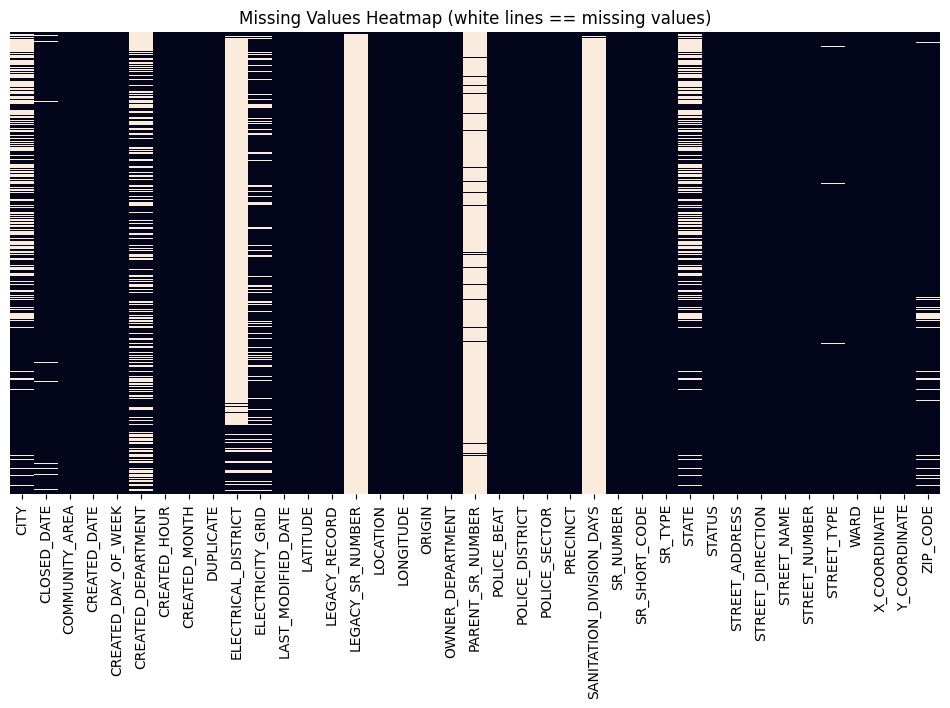

LEGACY_SR_NUMBER            99.59
SANITATION_DIVISION_DAYS    98.59
PARENT_SR_NUMBER            94.65
ELECTRICAL_DISTRICT         85.96
CREATED_DEPARTMENT          42.11
CITY                        33.56
STATE                       33.56
ELECTRICITY_GRID            18.09
ZIP_CODE                     6.44
CLOSED_DATE                  1.50
STREET_TYPE                  0.79
PRECINCT                     0.20
COMMUNITY_AREA               0.17
POLICE_SECTOR                0.17
POLICE_BEAT                  0.17
POLICE_DISTRICT              0.17
WARD                         0.17
LONGITUDE                    0.13
LOCATION                     0.13
LATITUDE                     0.13
X_COORDINATE                 0.12
Y_COORDINATE                 0.12
STREET_DIRECTION             0.12
STREET_NUMBER                0.12
STREET_NAME                  0.11
dtype: float64

In [21]:
# Ploting missiness pct with sampling

# Sorting
df_sample = df_sample.sort_values("CREATED_DATE")

# Plot
plt.figure(figsize=(12, 6))
sns.heatmap(df_sample.isna(), cbar=False, yticklabels=False)
plt.title('Missing Values Heatmap (white lines == missing values)')
plt.show()

# white lines -> missing values

# Missingess %
(df_sample.isna().mean().sort_values(ascending=False).head(25) * 100).round(decimals=2)

# High missingess columns:

# Unusable! (>80%)
# LEGACY_SR_NUMBER
# SANITATION_DIVISION_DAYS
# PARENT_SR_NUMBER
# ELECTRICAL_DISTRICT

# "Usable" if necessary
# CREATED_DEPARTMENT
# STATE
# CITY
# ELETRICITY_GRID
# ZIP_CODE

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

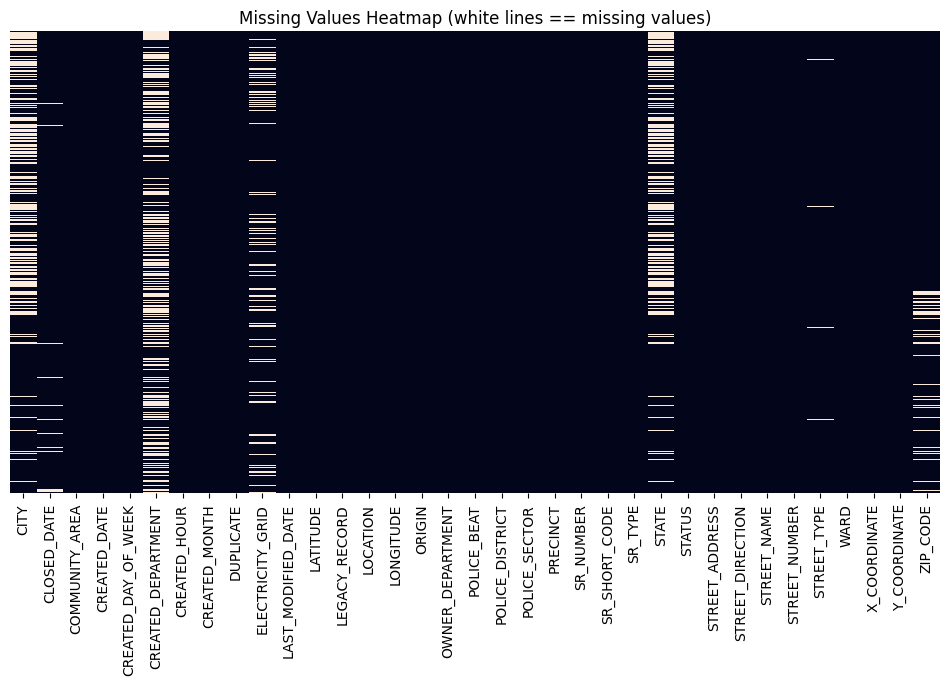

CREATED_DEPARTMENT    40.41
STATE                 32.78
CITY                  32.78
ELECTRICITY_GRID      17.28
ZIP_CODE               6.72
CLOSED_DATE            1.37
STREET_TYPE            0.81
PRECINCT               0.16
COMMUNITY_AREA         0.14
POLICE_BEAT            0.14
POLICE_SECTOR          0.14
POLICE_DISTRICT        0.14
WARD                   0.14
STREET_DIRECTION       0.10
LOCATION               0.10
LONGITUDE              0.10
LATITUDE               0.10
STREET_NUMBER          0.10
Y_COORDINATE           0.10
X_COORDINATE           0.10
STREET_NAME            0.09
STREET_ADDRESS         0.09
ORIGIN                 0.00
CREATED_HOUR           0.00
CREATED_MONTH          0.00
dtype: float64

In [22]:
# Excluding high missingness pct columns

# New view
con.execute("""
    CREATE OR REPLACE VIEW data_4 AS
    SELECT * EXCLUDE(
            LEGACY_SR_NUMBER,
            SANITATION_DIVISION_DAYS, 
            PARENT_SR_NUMBER, 
            ELECTRICAL_DISTRICT)
    FROM data_3;
""")

# Updating df_sample
df_sample = con.execute("""
    SELECT * FROM data_4 USING SAMPLE 10%
""").df()

# New missiness percentage with sampling

# Sorting
df_sample = df_sample.sort_values("CREATED_DATE")

# Plot
plt.figure(figsize=(12, 6))
sns.heatmap(df_sample.isna(), cbar=False, yticklabels=False)
plt.title('Missing Values Heatmap (white lines == missing values)')
plt.show()

# white lines -> missing values

# Missingess %
(df_sample.isna().mean().sort_values(ascending=False).head(25) * 100).round(decimals=2)

In [23]:
# Leading/lrailing whitespaces

# VARCHAR column of `data_4`
columns = con.execute("""
    SELECT column_name
    FROM information_schema.columns
    WHERE table_name = 'data_4'
      AND data_type LIKE '%VARCHAR%'
""").fetchall()

# Dynamic WHERE clause
conditions = " OR ".join(
    [
        f'"{col[0]}" IS NOT NULL AND "{col[0]}" != TRIM("{col[0]}")' # column is not null + original and trimmed are different
        for col in columns
    ]
)

# Execute query with dynamic WHERE clause
result = con.execute(f"""
    SELECT EXISTS (
        SELECT 1
        FROM data_4
        WHERE {conditions}
    );
""").fetchone()


# Output
#    True  - at least one whitespace issue exists
#    False - no whitespace detected

result # False

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

(False,)

**Overview**

**White horizontal lines = missing values**

- ✅ **>80% missing** - drop
- ✅ **≤40% missing** - keep (potentially useful later)



In [24]:
# Columns
df_sample.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1365429 entries, 13451 to 430117
Data columns (total 35 columns):
 #   Column               Non-Null Count    Dtype         
---  ------               --------------    -----         
 0   CITY                 917776 non-null   object        
 1   CLOSED_DATE          1346676 non-null  datetime64[us]
 2   COMMUNITY_AREA       1363517 non-null  Int64         
 3   CREATED_DATE         1365429 non-null  datetime64[us]
 4   CREATED_DAY_OF_WEEK  1365429 non-null  int64         
 5   CREATED_DEPARTMENT   813593 non-null   object        
 6   CREATED_HOUR         1365429 non-null  int64         
 7   CREATED_MONTH        1365429 non-null  int64         
 8   DUPLICATE            1365429 non-null  bool          
 9   ELECTRICITY_GRID     1129503 non-null  object        
 10  LAST_MODIFIED_DATE   1365429 non-null  datetime64[us]
 11  LATITUDE             1364083 non-null  float64       
 12  LEGACY_RECORD        1365429 non-null  bool          
 13 

### **Dataset Columns**

The dataset is left with **35 columns**.

The analysis will cover **key columns** representing most of the relevant data and the **secondary columns** (high 'redundancy' or irrelevant) will be set aside.
### **Key Columns**

**Operational Characteristics**
- SR_TYPE  
- CREATED_DEPARTMENT  
- OWNER_DEPARTMENT  
- STATUS  
- ORIGIN 

**Time Series**
- CREATED_DATE  
- LAST_MODIFIED_DATE  

**Geographical**
- LATITUDE  
- LONGITUDE  

### **Secondary Columns**

- CITY  
- CLOSED_DATE  
- COMMUNITY_AREA  
- CREATED_DAY_OF_WEEK  
- CREATED_HOUR  
- CREATED_MONTH  
- DUPLICATE  
- ELECTRICITY_GRID  
- LEGACY_RECORD  
- LOCATION  
- POLICE_BEAT  
- POLICE_DISTRICT  
- POLICE_SECTOR  
- PRECINCT  
- SR_NUMBER  
- SR_SHORT_CODE  
- STATE  
- STREET_ADDRESS  
- STREET_DIRECTION  
- STREET_NAME  
- STREET_NUMBER  
- STREET_TYPE  
- WARD  
- X_COORDINATE  
- Y_COORDINATE  
- ZIP_CODE  



### **Operational**

In [25]:
# SR_TYPE top 10
(df_sample['SR_TYPE']
    .value_counts(normalize=True)
    .sort_values(ascending=False) * 100
    ).round(decimals=2).head(10)

SR_TYPE
311 INFORMATION ONLY CALL                       35.97
Aircraft Noise Complaint                        17.08
Graffiti Removal Request                         4.96
Pothole in Street Complaint                      2.88
Street Light Out Complaint                       2.83
Rodent Baiting/Rat Complaint                     2.65
Garbage Cart Maintenance                         2.64
Abandoned Vehicle Complaint                      2.24
Tree Trim Request (NO LONGER BEING ACCEPTED)     2.06
Weed Removal Request                             1.46
Name: proportion, dtype: float64

In [26]:
# SR_TYPE: Rare yet high aging
rare_and_aging = (con.execute("""
SELECT
    SR_TYPE,
    ROUND(AVG(DATE_DIFF('day', CREATED_DATE, CLOSED_DATE)), 2) AS avg_days_open,
    ROUND(COUNT(*) * 100.0 / SUM(COUNT(*)) OVER (), 2) AS pct,
    COUNT(*) AS count
FROM data_4
WHERE CREATED_DATE IS NOT NULL
GROUP BY SR_TYPE
ORDER BY avg_days_open DESC, pct, count DESC
LIMIT 10;
""")
    .df()
)

rare_and_aging

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,SR_TYPE,avg_days_open,pct,count
0,Sidewalk Inspection Request,702.01,0.48,63959
1,Shared Cost Sidewalk Program Request,470.58,0.12,15649
2,Commercial Fire Safety Inspection Request,442.29,0.02,2164
3,Street Light Pole Door Missing Complaint,434.10,0.05,6366
4,Tree Planting Request,344.81,0.65,86425
5,Bicycle Request/Complaint,317.90,0.04,5213
6,Protected Bike Lane - Debris Removal,308.23,0.01,1647
7,Licensed Pharmaceutical Representative Complaint,286.12,0.00,52
8,Street Light On During Day Complaint,261.68,0.07,9689
9,Water Lead Test Visit Request,218.75,0.12,16288


In [27]:
# CREATED_DEPARTMENT top 10
(df_sample['CREATED_DEPARTMENT']
    .value_counts(normalize=True)
    .sort_values(ascending=False) * 100
    ).round(decimals=2).head(10)
# 311 City Services dominates the distribution

CREATED_DEPARTMENT
311 City Services                                  86.85
Alderman                                            5.91
CDOT - Department of Transportation                 3.62
Streets and Sanitation                              3.03
DWM - Department of Water Management                0.24
DOB - Buildings                                     0.11
Animal Care and Control                             0.07
Health                                              0.05
BACP - Business Affairs and Consumer Protection     0.05
Police                                              0.04
Name: proportion, dtype: float64

In [28]:
# OWNER_DEPARTMENT top 10
(df_sample['OWNER_DEPARTMENT']
    .value_counts(normalize=True)
    .sort_values(ascending=False) * 100
    ).round(decimals=2).head(10)

# 311 City Services + Aviation - Still dominant
# Streets and Sanitation + Administrative Departments - High Frequency

OWNER_DEPARTMENT
311 City Services                                  35.97
Streets and Sanitation                             25.86
Aviation                                           17.08
CDOT - Department of Transportation                11.35
DWM - Department of Water Management                4.17
DOB - Buildings                                     2.16
Animal Care and Control                             1.91
BACP - Business Affairs and Consumer Protection     0.67
Finance                                             0.27
Health                                              0.19
Name: proportion, dtype: float64

In [29]:
# STATUS top 10
(df_sample['STATUS']
    .value_counts(normalize=True)
    .sort_values(ascending=False) * 100
    ).round(decimals=2).head(10)

# >90% of requests are marked as "Completed".
# closure may be driven by automatic rules or operational workflows,
# which could bias SLA/time-to-close modeling and class imbalance.

STATUS
Completed    97.22
Canceled      1.41
Open          1.37
Name: proportion, dtype: float64

In [30]:
# ORIGIN top 10
(df_sample['ORIGIN']
    .value_counts(normalize=True)
    .sort_values(ascending=False) * 100
    ).round(decimals=2).head(10)

ORIGIN
Phone Call                  57.51
Internet                    26.81
Mobile Device                7.47
Mass Entry                   3.77
Alderman's Office            3.26
Salesforce Mobile App        0.24
DWM                          0.22
SPOTCSR                      0.21
Generated In House           0.17
spot-open311-SeeClickFix     0.08
Name: proportion, dtype: float64

In [31]:
# ORIGIN: Rare yet high aging
rare_and_aging = con.execute("""
  SELECT
      ORIGIN,
      ROUND(COUNT(*) * 100.0 / SUM(COUNT(*)) OVER (), 2) AS pct,
      ROUND(AVG(DATE_DIFF('day', CREATED_DATE, CLOSED_DATE)), 2) AS avg_days_open
                      
  FROM data_4
                        
  WHERE CREATED_DATE IS NOT NULL
                             
  GROUP BY ORIGIN
  ORDER BY pct DESC, avg_days_open DESC;
""").df()

rare_and_aging

# Legacy methods are very slow yet very rare
# E-mail, though modern, is slow and rare as mail
# Walking-in beats a State Representative by almost a week!
# A phone call is probably the most reliable way to register a complain!

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,ORIGIN,pct,avg_days_open
0,Phone Call,57.41,16.09
1,Internet,26.94,22.30
2,Mobile Device,7.46,39.42
3,Mass Entry,3.76,0.01
4,Alderman's Office,3.24,60.04
5,Salesforce Mobile App,0.24,31.05
6,DWM,0.23,57.60
7,SPOTCSR,0.22,12.89
8,Generated In House,0.18,62.98
9,spot-open311-SeeClickFix,0.08,82.09


**Operational Columns Overview**

**SR_TYPE**
- **"Information Only Call" dominates** - Many requests appear to be inquiries rather than actionable issues or maybe possibly functioning as a generic category.  
- **"Aircraft Noise Complaint" is the most common complaint** - The region hosts multiple major airports; further geographic analysis may clarify their spatial impact.  
- **General infrastructure complaints** - Categories related to buildings, roads, trees, water, and sanitation represent most of public service operational workload.
- **Several inspection-related requests** - Could indicate **possible backlog or administrative hurdles** rather than normal delays.

**CREATED_DEPARTMENT**

- **311 City Services + Alderman = ~90%** - Most requests seems to funnel through these departments before routing
- **Bureaucracy and Infrastructure** -  Inspections, permits, complaints and infrastructure-related requests represent the rest of services

**OWNER_DEPARTMENT**

- **Alignment with common SR_TYPES** - City services + Aviation dominates, followed by Infrastructure + inspection related, consistant with the behaviour mentioned in "SR_TYPE"

**STATUS**

- **Nearly 100% Completed** - Services request could be auto-closed (also could indicate completed != solved)
- **Stray animals** - Only closes if the animal is captured?
- **Water/Tree issues remain dominant** - High backlog?

**ORIGIN**
- **Phone Call leads** - resolution time is reasonable.
- **Internet and Mobile aren’t faster** - they can take longer.
- **Alderman’s Office requests can take much longer** 


### **Time Series**


In [32]:
# All time 
df_month = con.execute("""
    SELECT
        strftime(CREATED_DATE, '%m/%y') AS month,
        COUNT(*) AS n_requests
    FROM data_4
    GROUP BY month
    ORDER BY MIN(CREATED_DATE)
""").df()

df_month

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,month,n_requests
0,07/18,4228
1,08/18,4229
2,09/18,4746
3,10/18,7888
4,11/18,5513
...,...,...
87,10/25,174490
88,11/25,155418
89,12/25,153962
90,01/26,154830


In [33]:
year_change_marks = (
    df_month["month"]
    .astype(str)
    .loc[lambda x: x.str.startswith("01/")]
)

year_change_marks

6     01/19
18    01/20
30    01/21
42    01/22
54    01/23
66    01/24
78    01/25
90    01/26
Name: month, dtype: object

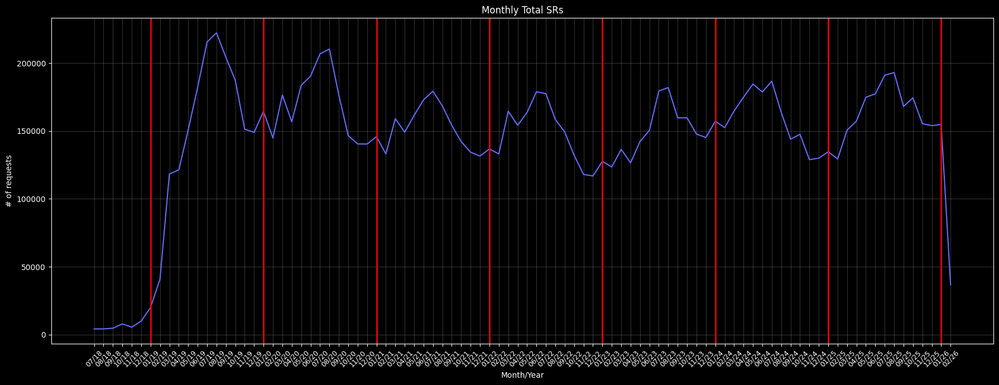

In [34]:
plt.style.use('dark_background')
plt.figure(figsize=(18,7))

sns.lineplot(data=df_month, x='month', y='n_requests', color='#636EFA')

for m in year_change_marks:
    plt.axvline(x=m, color='red', linestyle='-', alpha=.9, linewidth=2)

plt.title('Monthly Total SRs')
plt.xlabel('Month/Year')
plt.ylabel('# of requests')

plt.xticks(rotation=45, fontsize=9)
plt.grid(True, alpha=0.2)

plt.tight_layout()
plt.show()

# sazonal tendency with peaks in the middle of the yearEFA

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

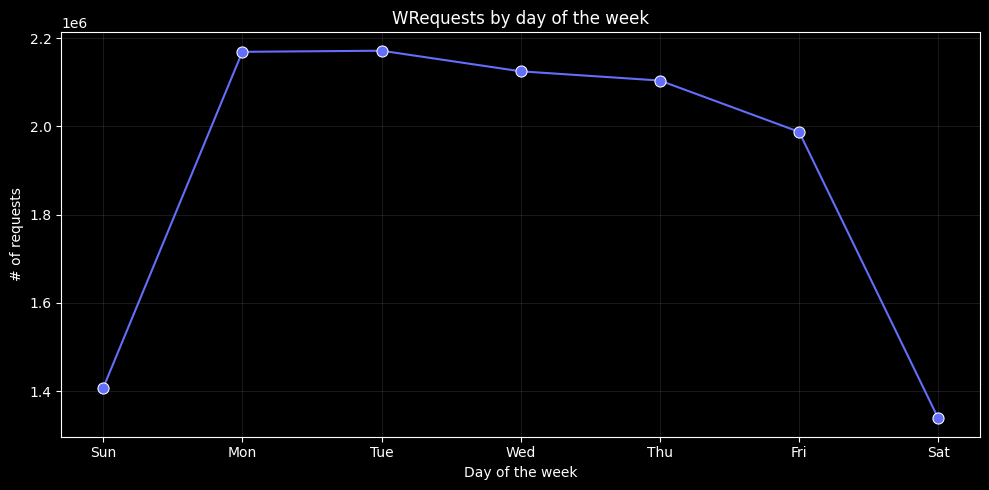

In [35]:
# Weekly aggregation
df_dow = con.execute("""
    SELECT
        CREATED_DAY_OF_WEEK AS day_of_week,
        COUNT(*) AS n_requests
    FROM data_4
    WHERE CREATED_DAY_OF_WEEK IS NOT NULL
    GROUP BY 1
    ORDER BY 1
""").df()

plt.style.use('dark_background')
plt.figure(figsize=(10,5))

sns.lineplot(data=df_dow, x='day_of_week', y='n_requests', marker='o', markersize=8, color='#636EFA')

plt.xticks(ticks=[1, 2, 3, 4, 5, 6, 7], labels=["Sun", "Mon", "Tue", "Wed", "Thu", "Fri", "Sat"])
plt.title('WRequests by day of the week')
plt.xlabel('Day of the week')
plt.ylabel('# of requests')

plt.grid(True, alpha=0.1)

plt.tight_layout()
plt.show()

# most of requests in week days

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Text(0, 0.5, '# of requests')

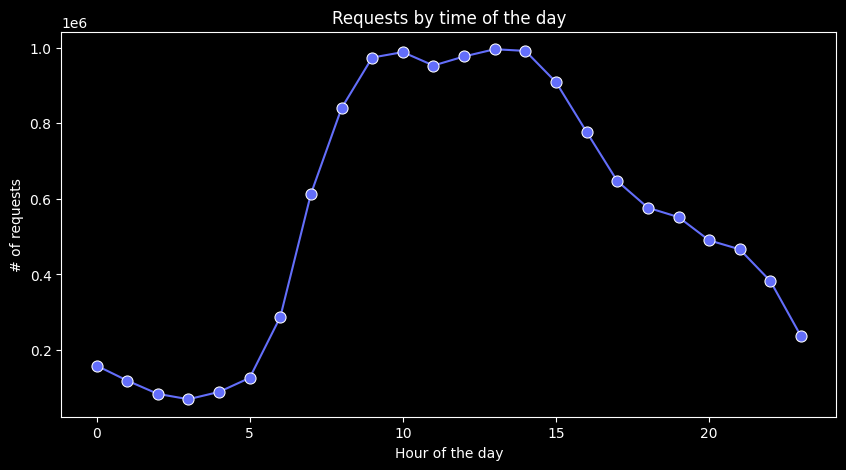

In [36]:
# Requests by hour of the day (Plotly)

df_hour = con.execute("""
    SELECT
        CREATED_HOUR AS hour,
        COUNT(*) AS n_requests
    FROM data_4
    WHERE CREATED_HOUR IS NOT NULL
    GROUP BY hour
    ORDER BY hour
""").df()

plt.style.use('dark_background')
plt.figure(figsize=(10,5))

sns.lineplot(data=df_hour, x='hour', y='n_requests', marker='o', markersize=8, color='#636EFA')

plt.title('Requests by time of the day')
plt.xlabel('Hour of the day')
plt.ylabel('# of requests')


# most of requests in work hours

**Time Series Overview**

- **Annual seasonality:** mid-year peaks and winter slowdowns  
- **Weekly pattern:** higher volumes on weekdays
- **Daily pattern:** concentration during business hours  

### **Geographic Patterns**


In [37]:
# % valid coordinates
stats = con.execute("""
    SELECT
        COUNT(*) AS n_total,
        COUNT(*) FILTER (
            WHERE latitude BETWEEN -90 AND 90
            AND longitude BETWEEN -180 AND 180
        ) AS n_valid
    FROM data_4
""").df()
stats["pct_valid"] = stats["n_valid"] / stats["n_total"]
stats["pct_valid"]

# almost 100%

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

0    0.998965
Name: pct_valid, dtype: float64

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
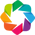

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

BokehModel(combine_events=True, render_bundle={'docs_json': {'f90b6f7e-9ac4-476a-a4c1-e5faa0cfb014': {'version…

In [38]:
# Service Requests Density
gv.extension("bokeh")
df = con.execute("""
    SELECT latitude AS lat, longitude AS lon
    FROM data_4
    WHERE latitude IS NOT NULL AND longitude IS NOT NULL
""").df()

locations = gv.Points(df, ["lon", "lat"])
points = datashade(locations, width=1200, height=1200,  cmap=fire, cnorm='eq_hist')
(gv.tile_sources.CartoDark * points).opts(width=600, height=600)


# All time city overview

In [40]:
import geoviews as gv
import datashader as ds
from holoviews.operation.datashader import datashade
from colorcet import fire

# Service Requests — Open Days spatial distribution
df = con.execute("""
    SELECT
        longitude AS lon,
        latitude  AS lat,
        DATE_DIFF('day', CREATED_DATE, CLOSED_DATE) AS open_days
    FROM data_4
    WHERE latitude IS NOT NULL
      AND longitude IS NOT NULL
      AND CLOSED_DATE IS NOT NULL
      AND CLOSED_DATE >= CREATED_DATE
""").df()

locations = gv.Points(df, ["lon", "lat"], vdims=["open_days"])

open_days_map = datashade(
    locations,
    aggregator=ds.mean("open_days"),
    width=1200,
    height=1200,
    cmap=fire,
    cnorm="eq_hist",
)

(gv.tile_sources.CartoDark * open_days_map).opts(width=600, height=600)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

BokehModel(combine_events=True, render_bundle={'docs_json': {'20bbf3ff-52d8-4f0f-b561-d8d3149b82b0': {'version…

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
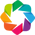

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

BokehModel(combine_events=True, render_bundle={'docs_json': {'5e5461d6-7b54-4ea7-9160-d4e8f8cf0440': {'version…

In [45]:
# Service Requests aircraft noise complaint
gv.extension("bokeh")

df = con.execute("""
    SELECT
        latitude  AS lat,
        longitude AS lon,
        COUNT(*)  AS noise_complaint
    FROM data_4
    WHERE latitude IS NOT NULL
      AND longitude IS NOT NULL
      AND SR_TYPE ILIKE '%aircraft%'
    GROUP BY 1, 2
""").df()

locations = gv.Points(df, ["lon", "lat"], vdims=["noise_complaint"])
points = datashade(locations, aggregator=ds.count(), width=1200,height=1200,cmap=fire, cnorm="eq_hist")
(gv.tile_sources.CartoDark * points).opts(width=600, height=600)

**Geographical Overview**
- Each pixel represents a location where service requests were made.
- Brighter areas indicate a higher concentration of requests within the same pixel.
- **SR Concentration spikes appear in the northern half of the city**, especially near downtown and along major avenues, while **southern half shows fewer concentration near the city limits**.
- Using **mean days open as the shading metric produces almost the opposite** pattern of the previous plot: **Open-time spikes appear near the city limits.**


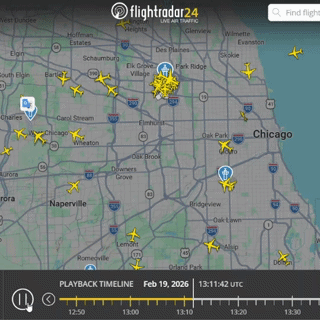

- Clusters in the northwest may be related mostly to **O'Hare Airport**, while clusters in the southwest may be related to **Midway Airport**.
The reports near downtown are not close to airports, but they may be linked to **aircraft on approach paths** or to **nearby heliports**.

### **Data Relationships**



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

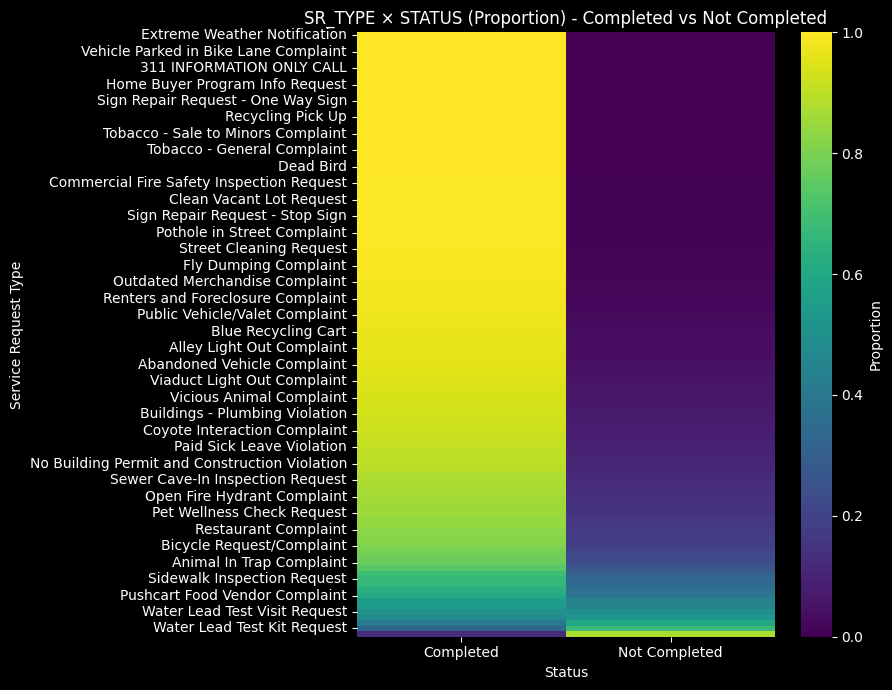

In [42]:
# SR_TYPE x Completed

df_sr = con.execute("""
    SELECT
        SR_TYPE,
        CASE WHEN STATUS = 'Completed' THEN 'Completed' ELSE 'Not Completed' END AS STATUS,
        ROUND(COUNT(*) * 1.0 / SUM(COUNT(*)) OVER (PARTITION BY SR_TYPE), 4) AS pct
    FROM data_4
    WHERE SR_TYPE IS NOT NULL
    GROUP BY 1, 2
""").df()

order = df_sr[df_sr["STATUS"] == "Completed"].sort_values("pct", ascending=False)["SR_TYPE"]
piv = df_sr.pivot(index="SR_TYPE", columns="STATUS", values="pct").loc[order].fillna(0.0)[["Completed", "Not Completed"]]

plt.figure(figsize=(9, 7))
sns.heatmap(
    piv, 
    cmap="viridis", 
    cbar_kws={'label': 'Proportion'}
)

plt.title("SR_TYPE × STATUS (Proportion) - Completed vs Not Completed")
plt.xlabel("Status")
plt.ylabel("Service Request Type")

plt.tight_layout()
plt.show()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

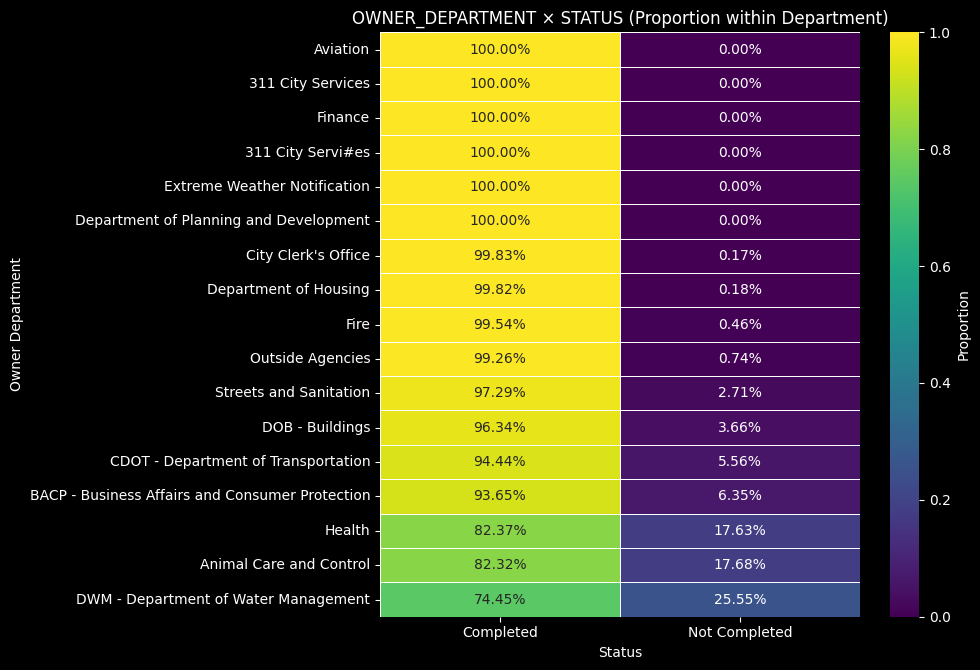

In [46]:

import matplotlib.pyplot as plt
import seaborn as sns

# Configurando o estilo dark
plt.style.use('dark_background')

# 1. Re-executando a Query de Proporção
df = con.execute("""
SELECT
    OWNER_DEPARTMENT,
    CASE WHEN STATUS = 'Completed' THEN 'Completed' ELSE 'Not Completed' END AS STATUS,
    ROUND(COUNT(*) * 1.0 / SUM(COUNT(*)) OVER (PARTITION BY OWNER_DEPARTMENT), 4) AS pct
FROM data_4
WHERE OWNER_DEPARTMENT IS NOT NULL AND STATUS IS NOT NULL
GROUP BY 1, 2
""").df()

# 2. Pivotando e Ordenando (Exatamente como na lógica original)
order = df[df["STATUS"] == "Completed"].sort_values("pct", ascending=False)["OWNER_DEPARTMENT"]
piv = (df.pivot(index="OWNER_DEPARTMENT", columns="STATUS", values="pct")
       .loc[order]
       .fillna(0.0)[["Completed", "Not Completed"]])

# 3. Plotagem com Seaborn
plt.figure(figsize=(10, max(6, 0.4 * len(piv.index))))

sns.heatmap(
    piv, 
    annot=True,          # Mostra os valores de proporção
    fmt=".2%",           # Formata como porcentagem
    cmap="viridis",      # Escala de cor solicitada (Viridis)
    cbar_kws={'label': 'Proportion'},
    linewidths=.5
)

plt.title("OWNER_DEPARTMENT × STATUS (Proportion within Department)")
plt.xlabel("Status")
plt.ylabel("Owner Department")
plt.tight_layout()
plt.show()

In [44]:
con.execute("""
    COPY data_4
    TO 'data/processed/eda.parquet'
    (FORMAT PARQUET)
""")

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

# **Overview**

### **Domain Understanding**
* **System Purpose:** Chicago 311 is the city's official "customer service desk" for non-emergency service requests.
* **Data Value:** A living dataset of **~13.3M records** providing a real-time window into **urban inequality, infrastructure decay, and citizen behavior**. It serves as an intelligence source for strategic planning and operational action.

### **Data Engineering & Preprocessing**
* **Consolidation:** Yearly CSV downloads were stacked and converted into a single **Parquet file** to ensure control and stability.
* **Technology:** **DuckDB** was used with pandas to improve speed and stability, utilizing sampling and SQL views to adjust dataset characteristics.
* **Data Quality:** * Identified and fixed missing values, duplicates, and type inconsistencies (e.g., Latitude/Longitude and Coordinate types).
    * **Exclusions:** Dropped columns with **>80% missingness** (LEGACY_SR_NUMBER, SANITATION_DIVISION_DAYS, PARENT_SR_NUMBER, ELECTRICAL_DISTRICT).
    * **Duplicates:** Excluded full row overlaps caused by joining multiple years during dataset creation.

### **Operational Insights**
* **Dominant Categories:** **"Information Only Call"** is the most frequent entry, followed by **"Aircraft Noise Complaint"** as the most common specific complaint.
* **Bureaucracy:** ~90% of requests funnel through **311 City Services** and **Aldermen** before being routed to specialized departments.
* **Status Bias:** Nearly **100% of requests** are marked as **"Completed"**, though this may be driven by automatic rules where "completed" does not necessarily mean "solved."
* **Origin Efficiency:** **Phone calls** lead with reasonable resolution times; Internet/Mobile channels are not faster, and Alderman’s Office requests can take significantly longer.

### **Spatiotemporal & Geographic Patterns**
* **Time Series:** Clear annual seasonality with **mid-year peaks** and winter slowdowns. Daily activity is concentrated during **weekdays and business hours**.
* **Spatial Distribution:** * **Concentration:** High density in the **northern half** of the city and downtown.
    * **The Inverse Pattern:** Using "mean days open" shows the opposite—**open-time spikes appear near the city limits** rather than in high-volume areas.
    * **Specific Clusters:** Northwest clusters are related to **O'Hare Airport**, while southwest clusters are related to **Midway Airport**.

### **Data Relationships**
* **Routing:** A **strong diagonal** in the mapping of SR types to departments indicates correctly routed requests, while off-diagonal instances suggest **misrouting**.